* Student name: Shayan Abdul Karim Khan
* Student pace: Self Paced
* Scheduled project review date/time:
* Instructor name: Abhineet Kulkarni

## Summary

## Problem Overview

A startup is planning on launching a books care package mmonthly subscription system where the user will be deliverd 5 books every quarter. The user will have the option to return whichever books they do not intend to keep within 7 days of receiving. Therefore it is crucial to ensure that the books delivered match the customer's preference otherwise returns can cause significant losses.

The intention is to use the ratings that users have given previous books to compute the 5 books that will be delivered. The task s to build a recommendation system that can take in certain features of the user and their history of book ratings and recommend the Top 5 books for that user.

## Data Sources

The following dataset is used to create a recommendation system. 
1. Ratings: https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset?select=Ratings.csv 
2. Books: https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset?select=Books.csv 
3. Users: https://www.kaggle.com/datasets/arashnic/book-recommendation-dataset?select=Users.csv 

This dataset contains data on more than 200,000 users with demographic information and collected from the reputable Book-Crossing community. It has also been cleaned to a certain extent which gives us leverage to focus more on the modelling part. This dataset contains features that are readilly available and will not make it extremely difficult for the company to expand the dataset. 

A recommendaation system based on less complicated data might not be highly accurate but it provides the option to add more features as needed. It is more difficult to unwind a complex model as compared to one using simple features.

## Initial Data Understanding and Data Cleaning

The Book-Crossing dataset comprises 3 files.

* Users

Contains the users. Note that user IDs (`User-ID`) have been anonymized and map to integers. Demographic data is provided (`Location`, `Age`) if available. Otherwise, these fields contain NULL-values.
<br>

* Books

Books are identified by their respective ISBN. Invalid ISBNs have already been removed from the dataset. Moreover, some content-based information is given (`Book-Title`, `Book-Author`, `Year-Of-Publication`, `Publisher`), obtained from Amazon Web Services. Note that in case of several authors, only the first is provided. URLs linking to cover images are also given, appearing in three different flavours (`Image-URL-S`, `Image-URL-M`, `Image-URL-L`), i.e., small, medium, large. These URLs point to the Amazon web site.
<br>

* Ratings

Contains the book rating information. Ratings (`Book-Rating`) are either explicit, expressed on a scale from 1-10 (higher values denoting higher appreciation), or implicit, expressed by 0.

In [89]:
import pandas as pd
import numpy as numpy

from plotly import express as px

### Books

In [90]:
books = pd.read_csv("data/Books.csv")

books.head()

/var/folders/qv/0z2v23tn1f1b2fnpqqgqsxch0000gn/T/ipykernel_61814/3925565007.py:1: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.



,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
0,0195153448,Classical Mythology,Mark P. O. Morford,2002,Oxford University Press,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...,http://images.amazon.com/images/P/0195153448.0...
1,0002005018,Clara Callan,Richard Bruce Wright,2001,HarperFlamingo Canada,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...,http://images.amazon.com/images/P/0002005018.0...
2,0060973129,Decision in Normandy,Carlo D'Este,1991,HarperPerennial,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...,http://images.amazon.com/images/P/0060973129.0...
3,0374157065,Flu: The Story of the Great Influenza Pandemic...,Gina Bari Kolata,1999,Farrar Straus Giroux,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...,http://images.amazon.com/images/P/0374157065.0...
4,0393045218,The Mummies of Urumchi,E. J. W. Barber,1999,W. W. Norton &amp; Company,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...,http://images.amazon.com/images/P/0393045218.0...


In [91]:
books.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 271360 entries, 0 to 271359
Data columns (total 8 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 271360 non-null  object
 1   Book-Title           271360 non-null  object
 2   Book-Author          271359 non-null  object
 3   Year-Of-Publication  271360 non-null  object
 4   Publisher            271358 non-null  object
 5   Image-URL-S          271360 non-null  object
 6   Image-URL-M          271360 non-null  object
 7   Image-URL-L          271357 non-null  object
dtypes: object(8)
memory usage: 16.6+ MB


In [92]:
books["Year-Of-Publication"].unique()

array([2002, 2001, 1991, 1999, 2000, 1993, 1996, 1988, 2004, 1998, 1994,
       2003, 1997, 1983, 1979, 1995, 1982, 1985, 1992, 1986, 1978, 1980,
       1952, 1987, 1990, 1981, 1989, 1984, 0, 1968, 1961, 1958, 1974,
       1976, 1971, 1977, 1975, 1965, 1941, 1970, 1962, 1973, 1972, 1960,
       1966, 1920, 1956, 1959, 1953, 1951, 1942, 1963, 1964, 1969, 1954,
       1950, 1967, 2005, 1957, 1940, 1937, 1955, 1946, 1936, 1930, 2011,
       1925, 1948, 1943, 1947, 1945, 1923, 2020, 1939, 1926, 1938, 2030,
       1911, 1904, 1949, 1932, 1928, 1929, 1927, 1931, 1914, 2050, 1934,
       1910, 1933, 1902, 1924, 1921, 1900, 2038, 2026, 1944, 1917, 1901,
       2010, 1908, 1906, 1935, 1806, 2021, '2000', '1995', '1999', '2004',
       '2003', '1990', '1994', '1986', '1989', '2002', '1981', '1993',
       '1983', '1982', '1976', '1991', '1977', '1998', '1992', '1996',
       '0', '1997', '2001', '1974', '1968', '1987', '1984', '1988',
       '1963', '1956', '1970', '1985', '1978', '1973', '1980'

In [93]:
books[books['Publisher'].isna()]

,ISBN,Book-Title,Book-Author,Year-Of-Publication,Publisher,Image-URL-S,Image-URL-M,Image-URL-L
128890,193169656X,Tyrant Moon,Elaine Corvidae,2002,NaN,http://images.amazon.com/images/P/193169656X.0...,http://images.amazon.com/images/P/193169656X.0...,http://images.amazon.com/images/P/193169656X.0...
129037,1931696993,Finders Keepers,Linnea Sinclair,2001,NaN,http://images.amazon.com/images/P/1931696993.0...,http://images.amazon.com/images/P/1931696993.0...,http://images.amazon.com/images/P/1931696993.0...


In [94]:
remove_value = ["DK Publishing Inc","Gallimard"]
books        = books[~books["Year-Of-Publication"].isin(remove_value)]

books["Year-Of-Publication"] = books["Year-Of-Publication"].astype(int)
books["Year-Of-Publication"].unique()

books = books[ books["Year-Of-Publication"] > 0   ]
books = books[ books["Year-Of-Publication"] < 2024]

In [95]:
books.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            1
Year-Of-Publication    0
Publisher              2
Image-URL-S            0
Image-URL-M            0
Image-URL-L            0
dtype: int64

In [96]:
books.drop(["Image-URL-S","Image-URL-M","Image-URL-L"],axis = 1,inplace = True)
books.dropna(inplace = True)
books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 266723 entries, 0 to 271359
Data columns (total 5 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   ISBN                 266723 non-null  object
 1   Book-Title           266723 non-null  object
 2   Book-Author          266723 non-null  object
 3   Year-Of-Publication  266723 non-null  int64 
 4   Publisher            266723 non-null  object
dtypes: int64(1), object(4)
memory usage: 12.2+ MB


In [97]:
books.isnull().sum()

ISBN                   0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
dtype: int64

In [98]:
books.duplicated().sum()

0

### Ratings

In [99]:
ratings = pd.read_csv("data/Ratings.csv")

ratings.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [100]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1149780 entries, 0 to 1149779
Data columns (total 3 columns):
 #   Column       Non-Null Count    Dtype 
---  ------       --------------    ----- 
 0   User-ID      1149780 non-null  int64 
 1   ISBN         1149780 non-null  object
 2   Book-Rating  1149780 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 26.3+ MB


In [101]:
ratings['Book-Rating'].describe()

count    1.149780e+06
mean     2.866950e+00
std      3.854184e+00
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      7.000000e+00
max      1.000000e+01
Name: Book-Rating, dtype: float64

In [102]:
ratings.isnull().sum()

User-ID        0
ISBN           0
Book-Rating    0
dtype: int64

In [103]:
ratings.duplicated().sum()

0

### Users

In [104]:
users = pd.read_csv("data/Users.csv")

users.head()

,User-ID,Location,Age
0,1,"nyc, new york, usa",NaN
1,2,"stockton, california, usa",18.0
2,3,"moscow, yukon territory, russia",NaN
3,4,"porto, v.n.gaia, portugal",17.0
4,5,"farnborough, hants, united kingdom",NaN


In [105]:
users.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 278858 entries, 0 to 278857
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   User-ID   278858 non-null  int64  
 1   Location  278858 non-null  object 
 2   Age       168096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 6.4+ MB


In [106]:
users.describe()["Age"]

count    168096.000000
mean         34.751434
std          14.428097
min           0.000000
25%          24.000000
50%          32.000000
75%          44.000000
max         244.000000
Name: Age, dtype: float64

In [107]:
users = users[users["Age"] > 16]
users =users[users["Age"] < 60]
users.head()

,User-ID,Location,Age
1,2,"stockton, california, usa",18.0
3,4,"porto, v.n.gaia, portugal",17.0
9,10,"albacete, wisconsin, spain",26.0
12,13,"barcelona, barcelona, spain",26.0
17,18,"rio de janeiro, rio de janeiro, brazil",25.0


In [108]:
users.isnull().sum()

User-ID     0
Location    0
Age         0
dtype: int64

In [109]:
users.describe()["Age"]

count    149636.000000
mean         34.040104
std          11.148989
min          17.000000
25%          25.000000
50%          32.000000
75%          42.000000
max          59.000000
Name: Age, dtype: float64

In [110]:
users["Location"] = users.Location.str.replace(",,",",")

users["Country"] = users.Location.map(lambda x : x.split(",")[-1].lower())

users["Country"].unique()



array([' usa', ' portugal', ' spain', ' brazil', ' germany', ' mexico',
       ' china', ' canada', ' italy', ' united kingdom', ' france',
       ' netherlands', ' iraq', ' new zealand', ' india', ' ghana',
       ' switzerland', ' iran', ' bosnia and herzegovina', ' australia',
       ' sri lanka', ' belgium', ' malaysia', ' turkey', ' philippines',
       ' finland', ' greece', ' chile', ' taiwan', ' pakistan', ' españa',
       ' denmark', ' nigeria', ' romania', ' argentina', ' vietnam',
       ' tunisia', ' egypt', ' uzbekistan', ' qatar', ' syria',
       ' austria', ' singapore', ' indonesia', '', ' sudan',
       ' saudi arabia', ' ireland', ' venezuela', ' mozambique',
       ' morocco', ' colombia', ' spain"', '"', ' sweden', ' poland',
       ' slovakia', ' bulgaria', ' basque country', ' ethiopia',
       ' portugal"', ' japan', ' norway', ' albania', ' cuba', ' russia',
       ' nigeria"', ' jersey', ' belarus', ' cape verde"', ' lithuania',
       ' costa rica', ' guyana

In [111]:
for special_char in """.!'",\/1234567890;&#?-{}[]()=_öð¹ú """:
    
    users["Country"] = users.Country.map(lambda x : x.replace(special_char,""))

users["Country"] = users.Country.map(lambda x : x.strip())

In [112]:
import pycountry

# Assuming your DataFrame is called 'data' and the country names are in the 'Country' column
country_column = 'Country'

# Get a set of valid country names from pycountry
valid_countries_set = list(set(country.name.lower() for country in pycountry.countries))
valid_countries_set += ["usa","russia"] 

# Check and flag invalid country names in the DataFrame
users['Is_Valid_Country'] = users[country_column].apply(lambda x: x in valid_countries_set)

# Filter out the rows with invalid country names
invalid_countries = users[~users['Is_Valid_Country']]
valid_countries = users[users['Is_Valid_Country']]

# Print the invalid country names
print("Invalid Country Percentage:")
print(invalid_countries[country_column].unique())
print()
print("Invalid Country Shape",invalid_countries.shape)
print()
print("Invalid Country Record Percentage",invalid_countries.shape[0]/users.shape[0]*100)
# print(invalid_countries[country_column].unique())
print("="*80)
# Print the valid country names
print("Valid Country Percentage:")
print(valid_countries[country_column].unique())
print()
print("Valid Country Shape", valid_countries.shape)
print()
print("Valid Country Record Percentage",valid_countries.shape[0]/users.shape[0]*100)

Invalid Country Percentage:
['unitedkingdom' 'newzealand' 'iran' 'bosniaandherzegovina' 'srilanka'
 'taiwan' 'españa' 'vietnam' 'syria' '' 'saudiarabia' 'venezuela'
 'basquecountry' 'capeverde' 'costarica' 'scotland' 'laargentina'
 'dominicanrepublic' 'brunei' 'hongkong' 'monterrey' 'unitedarabemirates'
 'yugoslavia' 'urugua' 'l`italia' 'sierraleone' 'trinidadandtobago'
 'lafrance' 'maroc' 'southafrica' 'macedonia' 'queenspark' 'brasil'
 'euskalherria' 'southkorea' 'galiza' 'usvirginislands' 'catalunya'
 'moldova' 'czechrepublic' 'burma' 'ksa' 'coted`ivoire'
 'catalunyacatalonia' 'mãâ©xico' 'caribbeansea' 'antiguaandbarbuda'
 'saintvincentandthegrenadines' 'lleida' 'caymanislands' 'uae' 'belgique'
 'deutschesreich' 'catalonia' 'micronesia' 'guineabissau' 'wales'
 'equatorialgeuinea' 'goteborg' 'unitedstates' 'bolivia' 'amalurra'
 'hamilton' 'the' 'catalunyaspain' 'deutschland' 'papuanewguinea'
 'burkinafaso' 'italia' 'puertorico' 'northkorea'
 'commonwealthofnorthernmarianaislands' 'ho

In [113]:
users = valid_countries.drop(["Is_Valid_Country"],axis = 1)
users.head()

,User-ID,Location,Age,Country
1,2,"stockton, california, usa",18.0,usa
3,4,"porto, v.n.gaia, portugal",17.0,portugal
9,10,"albacete, wisconsin, spain",26.0,spain
12,13,"barcelona, barcelona, spain",26.0,spain
17,18,"rio de janeiro, rio de janeiro, brazil",25.0,brazil


In [114]:
users.drop(['Location'],axis=1, inplace=True)

In [115]:
users.head()

,User-ID,Age,Country
1,2,18.0,usa
3,4,17.0,portugal
9,10,26.0,spain
12,13,26.0,spain
17,18,25.0,brazil


In [116]:
users.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 132724 entries, 1 to 278851
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   User-ID  132724 non-null  int64  
 1   Age      132724 non-null  float64
 2   Country  132724 non-null  object 
dtypes: float64(1), int64(1), object(1)
memory usage: 4.1+ MB


In [117]:
users.duplicated().sum()

0

## Data Preparation

In [118]:
ratings.shape

(1149780, 3)

In [119]:
users.shape

(132724, 3)

In [120]:
books.shape

(266723, 5)

In [121]:
ratings = ratings[ratings["User-ID"].isin(users["User-ID"].unique())]
ratings = ratings[ratings["ISBN"].isin(books["ISBN"].unique())]

In [122]:
ratings.shape

(650394, 3)

In [123]:
rating_books = ratings.merge(books, how='inner', on='ISBN')

In [124]:
rating_books.head()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,276733,2080674722,0,Les Particules Elementaires,Michel Houellebecq,1998,Flammarion
1,192101,2080674722,7,Les Particules Elementaires,Michel Houellebecq,1998,Flammarion
2,201170,2080674722,4,Les Particules Elementaires,Michel Houellebecq,1998,Flammarion
3,276747,0060517794,9,Little Altars Everywhere,Rebecca Wells,2003,HarperTorch
4,278843,0060517794,7,Little Altars Everywhere,Rebecca Wells,2003,HarperTorch


In [125]:
rating_books.shape

(650394, 7)

In [126]:
rating_books.isna().sum()

User-ID                0
ISBN                   0
Book-Rating            0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
dtype: int64

In [127]:
rating_books.duplicated().sum()

0

In [128]:
rating_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 650394 entries, 0 to 650393
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   User-ID              650394 non-null  int64 
 1   ISBN                 650394 non-null  object
 2   Book-Rating          650394 non-null  int64 
 3   Book-Title           650394 non-null  object
 4   Book-Author          650394 non-null  object
 5   Year-Of-Publication  650394 non-null  int64 
 6   Publisher            650394 non-null  object
dtypes: int64(3), object(4)
memory usage: 39.7+ MB


In [129]:
rating_books['Year-Of-Publication'].value_counts()

2002    58081
2001    50614
2003    50557
1999    47215
2000    45532
        ...  
2008        1
2010        1
1917        1
1914        1
1934        1
Name: Year-Of-Publication, Length: 99, dtype: int64

In [130]:
from datetime import datetime


rating_books['Year-Of-Publication'] = pd.to_datetime(rating_books['Year-Of-Publication'], format='%Y').dt.year

rating_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 650394 entries, 0 to 650393
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   User-ID              650394 non-null  int64 
 1   ISBN                 650394 non-null  object
 2   Book-Rating          650394 non-null  int64 
 3   Book-Title           650394 non-null  object
 4   Book-Author          650394 non-null  object
 5   Year-Of-Publication  650394 non-null  int64 
 6   Publisher            650394 non-null  object
dtypes: int64(3), object(4)
memory usage: 39.7+ MB


In [131]:
rating_books.head()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher
0,276733,2080674722,0,Les Particules Elementaires,Michel Houellebecq,1998,Flammarion
1,192101,2080674722,7,Les Particules Elementaires,Michel Houellebecq,1998,Flammarion
2,201170,2080674722,4,Les Particules Elementaires,Michel Houellebecq,1998,Flammarion
3,276747,0060517794,9,Little Altars Everywhere,Rebecca Wells,2003,HarperTorch
4,278843,0060517794,7,Little Altars Everywhere,Rebecca Wells,2003,HarperTorch


In [132]:
rating_books['Year-Of-Publication'].value_counts()

2002    58081
2001    50614
2003    50557
1999    47215
2000    45532
        ...  
2008        1
2010        1
1917        1
1914        1
1934        1
Name: Year-Of-Publication, Length: 99, dtype: int64

In [133]:
user_rating_books = rating_books.merge(users, how='inner', on='User-ID')
user_rating_books.head()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Age,Country
0,276733,2080674722,0,Les Particules Elementaires,Michel Houellebecq,1998,Flammarion,37.0,france
1,192101,2080674722,7,Les Particules Elementaires,Michel Houellebecq,1998,Flammarion,29.0,france
2,192101,9871138016,0,Cronica De Una Muerte Anunciada,Gabriel Marques Garcia,2002,Debols!llo,29.0,france
3,192101,2226070109,0,Un aller simple: Roman,Didier van Cauwelaert,1994,Albin Michel,29.0,france
4,192101,2264010991,0,Nocturne indien,Antonio Tabucchi,1988,Editions 10/18,29.0,france


In [134]:
user_rating_books.isna().sum()

User-ID                0
ISBN                   0
Book-Rating            0
Book-Title             0
Book-Author            0
Year-Of-Publication    0
Publisher              0
Age                    0
Country                0
dtype: int64

In [135]:
user_rating_books.duplicated().sum()

0

In [136]:
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 650394 entries, 0 to 650393
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   User-ID              650394 non-null  int64  
 1   ISBN                 650394 non-null  object 
 2   Book-Rating          650394 non-null  int64  
 3   Book-Title           650394 non-null  object 
 4   Book-Author          650394 non-null  object 
 5   Year-Of-Publication  650394 non-null  int64  
 6   Publisher            650394 non-null  object 
 7   Age                  650394 non-null  float64
 8   Country              650394 non-null  object 
dtypes: float64(1), int64(3), object(5)
memory usage: 49.6+ MB


In [137]:
user_rating_books['Age'].value_counts()

33.0    31394
29.0    27135
28.0    24754
30.0    24643
32.0    24477
34.0    24278
31.0    23570
36.0    23533
25.0    20664
44.0    20478
26.0    20474
38.0    20174
27.0    19946
43.0    19541
37.0    19474
35.0    18527
47.0    17889
23.0    17322
24.0    17151
52.0    17038
39.0    15953
46.0    15930
41.0    14698
40.0    14529
49.0    13498
51.0    13131
45.0    11186
22.0    10673
42.0    10035
21.0     9360
54.0     9022
58.0     8689
50.0     8648
57.0     8199
56.0     8128
18.0     8125
48.0     7239
53.0     6604
20.0     5981
55.0     5617
17.0     5078
19.0     4917
59.0     2692
Name: Age, dtype: int64

In [138]:
(user_rating_books.groupby("Book-Title").count()['Book-Rating'] > 20).sum()

4265

In [139]:
review_counts = user_rating_books.groupby("Book-Title").count()

review_counts = review_counts[review_counts['Book-Rating']>20]

titles = review_counts.index

titles

Index([''Salem's Lot', '10 Lb. Penalty', '101 Dalmatians',
       '16 Lighthouse Road', '1984', '1st to Die: A Novel',
       '2010: Odyssey Two', '204 Rosewood Lane', '2061: Odyssey Three',
       '24 Hours',
       ...
       'Yukon Ho!', 'Zen and the Art of Motorcycle Maintenance',
       'Zen and the Art of Motorcycle Maintenance: An Inquiry into Values',
       'Zia', 'Zodiac: The Eco-Thriller', 'Zoya', '\O\" Is for Outlaw"',
       '\Surely You're Joking, Mr. Feynman!\": Adventures of a Curious Character"',
       'e', 'stardust'],
      dtype='object', name='Book-Title', length=4265)

In [140]:
user_rating_books = user_rating_books[user_rating_books['Book-Title'].isin(titles)]

In [141]:
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 228312 entries, 10 to 650302
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   User-ID              228312 non-null  int64  
 1   ISBN                 228312 non-null  object 
 2   Book-Rating          228312 non-null  int64  
 3   Book-Title           228312 non-null  object 
 4   Book-Author          228312 non-null  object 
 5   Year-Of-Publication  228312 non-null  int64  
 6   Publisher            228312 non-null  object 
 7   Age                  228312 non-null  float64
 8   Country              228312 non-null  object 
dtypes: float64(1), int64(3), object(5)
memory usage: 17.4+ MB


## EDA

In [142]:
px.histogram(user_rating_books['Age'],title="User's Age Distribution")

In [143]:
country_data = user_rating_books.groupby("Country").size().sort_values(ascending= False).head(10)

names = country_data.index
values = country_data.values

px.pie(values = values, names = names,title = "Top 10 countries Total Users read Books")

In [144]:
user_rating_books["Country"].value_counts(normalize=True)

usa          0.826229
canada       0.094875
australia    0.014414
germany      0.011572
portugal     0.009505
               ...   
zambia       0.000004
mauritius    0.000004
tunisia      0.000004
georgia      0.000004
monaco       0.000004
Name: Country, Length: 86, dtype: float64

In [145]:
countries = ['usa']#, 'canada', 'germany', 'spain', 'australia']
user_rating_books = user_rating_books[user_rating_books['Country'].isin(countries)]
user_rating_books.head()

,User-ID,ISBN,Book-Rating,Book-Title,Book-Author,Year-Of-Publication,Publisher,Age,Country
51,276747,0060517794,9,Little Altars Everywhere,Rebecca Wells,2003,HarperTorch,25.0,usa
52,276747,0451192001,0,How Stella Got Her Groove Back,Terry McMillan,1997,Signet Book,25.0,usa
53,276747,0609801279,0,The Law of Love,Laura Esquivel,1997,Three Rivers Press (CA),25.0,usa
54,276747,0671537458,9,Waiting to Exhale,Terry McMillan,1995,Pocket,25.0,usa
55,276747,0679776818,8,Birdsong: A Novel of Love and War,Sebastian Faulks,1997,Vintage Books USA,25.0,usa


In [146]:
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 188638 entries, 51 to 650266
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   User-ID              188638 non-null  int64  
 1   ISBN                 188638 non-null  object 
 2   Book-Rating          188638 non-null  int64  
 3   Book-Title           188638 non-null  object 
 4   Book-Author          188638 non-null  object 
 5   Year-Of-Publication  188638 non-null  int64  
 6   Publisher            188638 non-null  object 
 7   Age                  188638 non-null  float64
 8   Country              188638 non-null  object 
dtypes: float64(1), int64(3), object(5)
memory usage: 14.4+ MB


In [147]:
user_rating_books['Country'].value_counts()

usa    188638
Name: Country, dtype: int64

In [148]:
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 188638 entries, 51 to 650266
Data columns (total 9 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   User-ID              188638 non-null  int64  
 1   ISBN                 188638 non-null  object 
 2   Book-Rating          188638 non-null  int64  
 3   Book-Title           188638 non-null  object 
 4   Book-Author          188638 non-null  object 
 5   Year-Of-Publication  188638 non-null  int64  
 6   Publisher            188638 non-null  object 
 7   Age                  188638 non-null  float64
 8   Country              188638 non-null  object 
dtypes: float64(1), int64(3), object(5)
memory usage: 14.4+ MB


In [149]:
# from imblearn.over_sampling import RandomOverSampler
# from imblearn.under_sampling import RandomUnderSampler

# # Calculate the desired number of records based on equal percentage
# total_records = len(user_rating_books)  # Adjust the total number of desired records
# desired_percentage = 1 / 5  # Equal percentage for top 5 countries
# desired_records = int(total_records * desired_percentage)

# # Calculate the scaling factor to adjust the number of records
# scaling_factor = desired_records / 100

# # Adjust the number of records for each country
# top_countries['DesiredRecords'] = (top_countries['Percentage'] * scaling_factor).astype(int)

# undersamplers = {
#     country: RandomUnderSampler(sampling_strategy=top_countries.loc[country, 'DesiredRecords'], random_state=42)
#     for country in top_countries['Country']
# }

# undersampled_data = []
# for country, sampler in undersamplers.items():
#     country_data = df[df['Country'] == country]
#     X_resampled, y_resampled = sampler.fit_resample(country_data[['Country']], country_data['Percentage'])
#     undersampled_data.append(pd.DataFrame({'Country': X_resampled.flatten(), 'Percentage': y_resampled}))

# undersampled_df = pd.concat(undersampled_data)

# oversampler = RandomOverSampler(sampling_strategy='not majority', random_state=42)
# X_resampled, y_resampled = oversampler.fit_resample(undersampled_df[['Country']], undersampled_df['Percentage'])

# balanced_data = pd.DataFrame({'Country': X_resampled.flatten(), 'Percentage': y_resampled})

# print(balanced_data)

In [150]:
px.histogram(user_rating_books['Book-Rating'],title="Distribution of Book Ratings")

In [151]:
rating_book = user_rating_books[user_rating_books['Book-Rating'] >= 5]
rating_book_under5 = user_rating_books[(user_rating_books['Book-Rating'] < 5) & (user_rating_books['Book-Rating'] > 0)]

In [152]:
px.histogram(rating_book['Book-Rating'],title="Distribution of Book Ratings")

In [153]:
rating_book['Book-Rating'].value_counts(normalize=True)

8     0.254771
10    0.223745
9     0.188177
7     0.167870
5     0.089944
6     0.075494
Name: Book-Rating, dtype: float64

In [154]:
len(rating_book_under5['Book-Rating'])*100/(len(rating_book_under5['Book-Rating'])+
                                            len(rating_book['Book-Rating']))

3.6977042131149953

In [155]:
user_rating_books = user_rating_books[user_rating_books['Book-Rating'] >= 5]

In [156]:
avg_rating_book = user_rating_books.groupby("Book-Title").mean()["Book-Rating"].sort_values(ascending=False)

In [157]:
px.histogram(avg_rating_book,title="Distribution of Average Book Ratings", nbins=7)

In [172]:
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65396 entries, 51 to 650266
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   User-ID              65396 non-null  int64  
 1   ISBN                 65396 non-null  object 
 2   Book-Rating          65396 non-null  int64  
 3   Book-Title           65396 non-null  object 
 4   Book-Author          65396 non-null  object 
 5   Year-Of-Publication  65396 non-null  int64  
 6   Publisher            65396 non-null  object 
 7   Age                  65396 non-null  float64
 8   Country              65396 non-null  object 
 9   Age_Category         65396 non-null  object 
dtypes: float64(1), int64(3), object(6)
memory usage: 5.5+ MB


In [174]:
high_rated_books_age = user_rating_books[user_rating_books['Book-Rating'] == 10]['Age']

# high_rated_books_age =  user_rating_books[user_rating_books["Book-Title"].isin(high_rated_books)]

px.histogram(high_rated_books_age,title="Distribution of Age for Book Ratings 10/10 ")

In [176]:
high_rated_books_age = user_rating_books[user_rating_books['Book-Rating'] == 9]['Age']

# high_rated_books_age =  user_rating_books[user_rating_books["Book-Title"].isin(high_rated_books)]

px.histogram(high_rated_books_age,title="Distribution of Age for Book Ratings 9/10 ")

In [177]:
high_rated_books_age = user_rating_books[user_rating_books['Book-Rating'] == 8]['Age']

# high_rated_books_age =  user_rating_books[user_rating_books["Book-Title"].isin(high_rated_books)]

px.histogram(high_rated_books_age,title="Distribution of Age for Book Ratings 8/10 ")

In [178]:
high_rated_books_age = user_rating_books[user_rating_books['Book-Rating'] == 7]['Age']

# high_rated_books_age =  user_rating_books[user_rating_books["Book-Title"].isin(high_rated_books)]

px.histogram(high_rated_books_age,title="Distribution of Age for Book Ratings 7/10 ")

In [179]:
high_rated_books_age = user_rating_books[user_rating_books['Book-Rating'] == 6]['Age']

# high_rated_books_age =  user_rating_books[user_rating_books["Book-Title"].isin(high_rated_books)]

px.histogram(high_rated_books_age,title="Distribution of Age for Book Ratings 6/10 ")

In [180]:
high_rated_books_age = user_rating_books[user_rating_books['Book-Rating'] == 5]['Age']

# high_rated_books_age =  user_rating_books[user_rating_books["Book-Title"].isin(high_rated_books)]

px.histogram(high_rated_books_age,title="Distribution of Age for Book Ratings 5/10 ")

In [192]:
user_rating_books['Age'].min()

17.0

In [196]:
# Asigned temp data 
data = user_rating_books

# Create age categories using a temporary column
data['Age_Category'] = pd.cut(data['Age'], bins=range(16, 61, 4), right=False).astype(str)

# Calculate average ratings for each age category
avg_ratings = data.groupby('Age_Category')['Book-Rating'].mean().reset_index()

# Create the plot using Plotly Express
fig = px.bar(avg_ratings, x='Age_Category', y='Book-Rating', labels={'Age_Category': 'Age Group', 'Rating': 'Average Rating'}, title = "Average Rating VS Age Group for ")

# Customize the plot layout
fig.update_layout(title='Average Ratings by Age Group', xaxis_title='Age Group', yaxis_title='Average Rating')

# Show the plot
fig.show()

In [165]:
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65396 entries, 51 to 650266
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   User-ID              65396 non-null  int64  
 1   ISBN                 65396 non-null  object 
 2   Book-Rating          65396 non-null  int64  
 3   Book-Title           65396 non-null  object 
 4   Book-Author          65396 non-null  object 
 5   Year-Of-Publication  65396 non-null  int64  
 6   Publisher            65396 non-null  object 
 7   Age                  65396 non-null  float64
 8   Country              65396 non-null  object 
 9   Age_Category         65396 non-null  object 
dtypes: float64(1), int64(3), object(6)
memory usage: 5.5+ MB


In [197]:
#assigned temp data 
data = user_rating_books

# Create age categories using a temporary column
data['Age_Category'] = pd.cut(data['Age'], bins=range(16, 61, 4), right=False).astype(str)

px.scatter(data , x='Year-Of-Publication',y='Age_Category' , title = "Age VS Year of Publication for Popular books")

In [215]:
px.scatter(user_rating_books, x='Year-Of-Publication', y='Age',title = "Age VS Year of Publication for Popular books")

In [217]:
user_rating_books = user_rating_books[user_rating_books['Year-Of-Publication']>=1970]

user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65017 entries, 51 to 650266
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   User-ID              65017 non-null  int64  
 1   ISBN                 65017 non-null  object 
 2   Book-Rating          65017 non-null  int64  
 3   Book-Title           65017 non-null  object 
 4   Book-Author          65017 non-null  object 
 5   Year-Of-Publication  65017 non-null  int64  
 6   Publisher            65017 non-null  object 
 7   Age                  65017 non-null  float64
 8   Country              65017 non-null  object 
 9   Age_Category         65017 non-null  object 
dtypes: float64(1), int64(3), object(6)
memory usage: 5.5+ MB


In [218]:
data = user_rating_books.groupby(['Book-Author']).mean().sort_values(['Book-Rating'],ascending=False).head(20)

px.bar(data['Age'], title = "Average Age VS Top 10 Rated Book Authors")

In [238]:
Author = books.groupby("Book-Author").size().sort_values(ascending = False).head(20)
Author = pd.DataFrame({"Book-Author":Author.index,"No of Books Written":Author.values})

px.bar(data_frame = Author, y="Book-Author", x="No of Books Written" , title = "Top 20 Most books written by Author")

In [224]:
publisher = user_rating_books.groupby("Publisher").size().sort_values(ascending = False).head(20)
publisher = pd.DataFrame({"Publisher":publisher.index,"No of Books Published":publisher.values})

px.bar(data_frame = publisher, y="Publisher", x="No of Books Published" , title = "Top 20 Most books Published by Publisher")

In [219]:
user_rating_books.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65017 entries, 51 to 650266
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   User-ID              65017 non-null  int64  
 1   ISBN                 65017 non-null  object 
 2   Book-Rating          65017 non-null  int64  
 3   Book-Title           65017 non-null  object 
 4   Book-Author          65017 non-null  object 
 5   Year-Of-Publication  65017 non-null  int64  
 6   Publisher            65017 non-null  object 
 7   Age                  65017 non-null  float64
 8   Country              65017 non-null  object 
 9   Age_Category         65017 non-null  object 
dtypes: float64(1), int64(3), object(6)
memory usage: 5.5+ MB


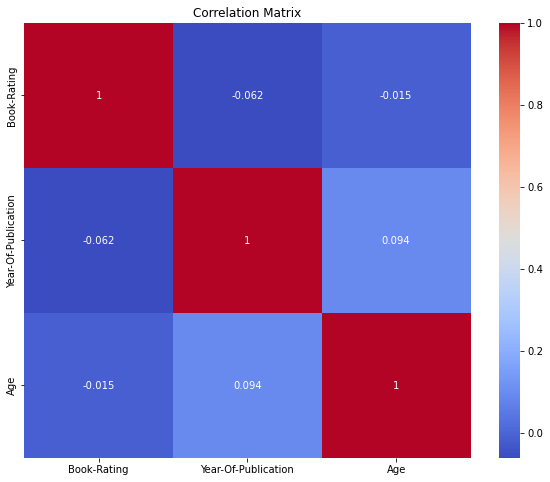

In [242]:
import seaborn as sns
import matplotlib.pyplot as plt

# columns_to_correlate = ['Book-Rating', 'Book-Author', 'Year-Of-Publication', 'Publisher', 'Age', 'Country', 'Age_Category']
correlation_data = user_rating_books[['Book-Rating', 'Year-Of-Publication', 'Age']]

correlation_matrix = correlation_data.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

## Data Preparation for Modelling

In [245]:
from surprise import Dataset, Reader

from surprise.model_selection import train_test_split
from sklearn import model_selection 

from imblearn.under_sampling import RandomUnderSampler

# from sklearn.model_selection import train_test_split,RandomizedSearchCV,GridSearchCV
from tqdm import tqdm

## Modelling and Evaluation

## Results

## Conclusion & Recommendation